In [2]:
!pip install -q kaggle

In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mehranehmgh","key":"c2c1365e6432393d8c5dfbe309c0236c"}'}

In [4]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d selfishgene/historical-hourly-weather-data

 42% 5.00M/12.0M [00:00<00:00, 43.1MB/s]
100% 12.0M/12.0M [00:00<00:00, 58.7MB/s]


In [6]:
!unzip '/content/historical-hourly-weather-data.zip' -d '/content/'

Archive:  /content/historical-hourly-weather-data.zip
  inflating: /content/city_attributes.csv  
  inflating: /content/humidity.csv   
  inflating: /content/pressure.csv   
  inflating: /content/temperature.csv  
  inflating: /content/weather_description.csv  
  inflating: /content/wind_direction.csv  
  inflating: /content/wind_speed.csv  


In [7]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [8]:
temperature = pd.read_csv('/content/temperature.csv')

In [9]:
temperature

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,San Antonio,Dallas,Houston,Kansas City,Minneapolis,Saint Louis,Chicago,Nashville,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Toronto,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,309.100000,NaN,NaN,NaN
1,2012-10-01 13:00:00,284.630000,282.080000,289.480000,281.800000,291.870000,291.530000,293.410000,296.600000,285.120000,284.610000,289.290000,289.740000,288.270000,289.980000,286.870000,286.180000,284.010000,287.410000,283.850000,294.030000,284.030000,298.170000,288.650000,299.720000,281.000000,286.260000,285.630000,288.220000,285.830000,287.170000,307.590000,305.470000,310.580000,304.4,304.4,303.5
2,2012-10-01 14:00:00,284.629041,282.083252,289.474993,281.797217,291.868186,291.533501,293.403141,296.608509,285.154558,284.607306,289.303649,289.762974,288.297576,289.997635,286.893636,286.185246,284.054691,287.421360,283.889394,294.035341,284.069789,298.205230,288.650172,299.732518,281.024767,286.262541,285.663208,288.247676,285.834650,287.186092,307.590000,304.310000,310.495769,304.4,304.4,303.5
3,2012-10-01 15:00:00,284.626998,282.091866,289.460618,281.789833,291.862844,291.543355,293.392177,296.631487,285.233952,284.599918,289.338497,289.830767,288.334343,290.038151,286.951401,286.199194,284.177412,287.454637,283.941919,294.049702,284.173965,298.299595,288.650582,299.766579,281.088319,286.269518,285.756824,288.326940,285.847790,287.231672,307.391513,304.281841,310.411538,304.4,304.4,303.5
4,2012-10-01 16:00:00,284.624955,282.100481,289.446243,281.782449,291.857503,291.553209,293.381213,296.654466,285.313345,284.592530,289.373345,289.898560,288.371111,290.078666,287.009166,286.213142,284.300133,287.487914,283.994444,294.064063,284.278140,298.393961,288.650991,299.800641,281.151870,286.276496,285.850440,288.406203,285.860929,287.277251,307.145200,304.238015,310.327308,304.4,304.4,303.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,NaN,282.000000,NaN,280.820000,293.550000,292.150000,289.540000,294.710000,285.720000,289.560000,294.700000,290.480000,295.150000,285.330000,279.790000,285.410000,281.340000,292.890000,285.980000,290.040000,281.250000,296.920000,294.150000,NaN,285.300000,278.740000,290.240000,NaN,275.130000,288.080000,NaN,NaN,NaN,NaN,NaN,NaN
45249,2017-11-29 21:00:00,NaN,282.890000,NaN,281.650000,295.680000,292.740000,290.610000,295.590000,286.450000,290.700000,295.820000,291.020000,295.820000,285.160000,280.220000,286.010000,281.690000,292.400000,286.170000,291.420000,281.050000,296.920000,293.900000,NaN,285.330000,278.750000,289.240000,NaN,274.130000,286.020000,NaN,NaN,NaN,NaN,NaN,NaN
45250,2017-11-29 22:00:00,NaN,283.390000,NaN,282.750000,295.960000,292.580000,291.340000,296.250000,286.440000,289.710000,296.040000,291.150000,296.370000,285.160000,279.920000,286.040000,281.070000,291.650000,284.210000,291.840000,280.170000,296.330000,292.060000,NaN,282.910000,277.550000,286.780000,NaN,273.480000,283.940000,NaN,NaN,NaN,NaN,NaN,NaN
45251,2017-11-29 23:00:00,NaN,283.020000,NaN,282.960000,295.650000,292.610000,292.150000,297.150000,286.140000,289.170000,295.280000,289.590000,294.650000,285.360000,279.070000,285.030000,280.060000,287.640000,283.200000,290.640000,278.060000,294.950000,287.580000,NaN,280.140000,276.160000,284.570000,NaN,272.480000,282.170000,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
temperature.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45253 entries, 0 to 45252
Data columns (total 37 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   datetime           45253 non-null  object 
 1   Vancouver          44458 non-null  float64
 2   Portland           45252 non-null  float64
 3   San Francisco      44460 non-null  float64
 4   Seattle            45250 non-null  float64
 5   Los Angeles        45250 non-null  float64
 6   San Diego          45252 non-null  float64
 7   Las Vegas          45252 non-null  float64
 8   Phoenix            45250 non-null  float64
 9   Albuquerque        45252 non-null  float64
 10  Denver             45252 non-null  float64
 11  San Antonio        45252 non-null  float64
 12  Dallas             45249 non-null  float64
 13  Houston            45250 non-null  float64
 14  Kansas City        45252 non-null  float64
 15  Minneapolis        45240 non-null  float64
 16  Saint Louis        452

In [11]:
temperature.isna().sum()

datetime               0
Vancouver            795
Portland               1
San Francisco        793
Seattle                3
Los Angeles            3
San Diego              1
Las Vegas              1
Phoenix                3
Albuquerque            1
Denver                 1
San Antonio            1
Dallas                 4
Houston                3
Kansas City            1
Minneapolis           13
Saint Louis            1
Chicago                3
Nashville              2
Indianapolis           7
Atlanta                6
Detroit                1
Jacksonville           1
Charlotte              3
Miami                805
Pittsburgh             3
Toronto                1
Philadelphia           3
New York             793
Montreal               3
Boston                 3
Beersheba            798
Tel Aviv District    793
Eilat                792
Haifa                798
Nahariyya            797
Jerusalem            793
dtype: int64

In [12]:
humidity = pd.read_csv('/content/humidity.csv')

In [13]:
humidity

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,San Antonio,Dallas,Houston,Kansas City,Minneapolis,Saint Louis,Chicago,Nashville,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Toronto,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,NaN,NaN,NaN
1,2012-10-01 13:00:00,76.0,81.0,88.0,81.0,88.0,82.0,22.0,23.0,50.0,62.0,93.0,87.0,93.0,71.0,67.0,71.0,71.0,100.0,76.0,94.0,76.0,88.0,87.0,83.0,93.0,82.0,71.0,58.0,93.0,68.0,50.0,63.0,22.0,51.0,51.0,50.0
2,2012-10-01 14:00:00,76.0,80.0,87.0,80.0,88.0,81.0,21.0,23.0,49.0,62.0,92.0,86.0,92.0,70.0,66.0,71.0,70.0,99.0,76.0,94.0,75.0,87.0,87.0,82.0,93.0,81.0,70.0,57.0,91.0,68.0,51.0,62.0,22.0,51.0,51.0,50.0
3,2012-10-01 15:00:00,76.0,80.0,86.0,80.0,88.0,81.0,21.0,23.0,49.0,62.0,92.0,86.0,90.0,70.0,66.0,71.0,70.0,99.0,76.0,94.0,75.0,87.0,87.0,82.0,93.0,79.0,70.0,57.0,87.0,68.0,51.0,62.0,22.0,51.0,51.0,50.0
4,2012-10-01 16:00:00,77.0,80.0,85.0,79.0,88.0,81.0,21.0,23.0,49.0,62.0,92.0,86.0,89.0,70.0,65.0,71.0,70.0,99.0,76.0,94.0,74.0,87.0,87.0,82.0,93.0,77.0,69.0,57.0,84.0,68.0,52.0,62.0,22.0,51.0,51.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,NaN,81.0,NaN,93.0,24.0,72.0,18.0,68.0,37.0,18.0,37.0,45.0,68.0,32.0,31.0,32.0,52.0,32.0,32.0,82.0,39.0,47.0,21.0,NaN,20.0,45.0,27.0,NaN,64.0,37.0,NaN,NaN,NaN,NaN,NaN,NaN
45249,2017-11-29 21:00:00,NaN,71.0,NaN,87.0,21.0,72.0,18.0,73.0,34.0,12.0,35.0,42.0,73.0,27.0,31.0,37.0,65.0,34.0,32.0,73.0,39.0,47.0,21.0,NaN,23.0,48.0,29.0,NaN,59.0,74.0,NaN,NaN,NaN,NaN,NaN,NaN
45250,2017-11-29 22:00:00,NaN,71.0,NaN,93.0,23.0,68.0,17.0,60.0,32.0,15.0,38.0,42.0,50.0,27.0,30.0,37.0,96.0,36.0,39.0,77.0,42.0,53.0,24.0,NaN,27.0,52.0,31.0,NaN,66.0,74.0,NaN,NaN,NaN,NaN,NaN,NaN
45251,2017-11-29 23:00:00,NaN,71.0,NaN,87.0,14.0,63.0,17.0,33.0,30.0,28.0,37.0,45.0,49.0,30.0,35.0,46.0,75.0,39.0,52.0,82.0,52.0,73.0,38.0,NaN,36.0,64.0,26.0,NaN,58.0,56.0,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
humidity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45253 entries, 0 to 45252
Data columns (total 37 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   datetime           45253 non-null  object 
 1   Vancouver          43427 non-null  float64
 2   Portland           44804 non-null  float64
 3   San Francisco      44311 non-null  float64
 4   Seattle            44964 non-null  float64
 5   Los Angeles        45101 non-null  float64
 6   San Diego          44909 non-null  float64
 7   Las Vegas          44411 non-null  float64
 8   Phoenix            43945 non-null  float64
 9   Albuquerque        44543 non-null  float64
 10  Denver             43445 non-null  float64
 11  San Antonio        44689 non-null  float64
 12  Dallas             44934 non-null  float64
 13  Houston            45132 non-null  float64
 14  Kansas City        44741 non-null  float64
 15  Minneapolis        44743 non-null  float64
 16  Saint Louis        439

In [15]:
humidity.isna().sum()

datetime                0
Vancouver            1826
Portland              449
San Francisco         942
Seattle               289
Los Angeles           152
San Diego             344
Las Vegas             842
Phoenix              1308
Albuquerque           710
Denver               1808
San Antonio           564
Dallas                319
Houston               121
Kansas City           512
Minneapolis           510
Saint Louis          1289
Chicago              1109
Nashville             567
Indianapolis          695
Atlanta               422
Detroit               862
Jacksonville          209
Charlotte             589
Miami                1087
Pittsburgh            522
Toronto               728
Philadelphia          624
New York             1624
Montreal             1696
Boston                449
Beersheba             859
Tel Aviv District    1113
Eilat                 970
Haifa                 818
Nahariyya             817
Jerusalem             906
dtype: int64

In [16]:
pressure = pd.read_csv('/content/pressure.csv')

In [17]:
pressure

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,San Antonio,Dallas,Houston,Kansas City,Minneapolis,Saint Louis,Chicago,Nashville,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Toronto,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1011.0,NaN,NaN,NaN
1,2012-10-01 13:00:00,NaN,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,1014.0,1011.0,1009.0,1011.0,1012.0,1010.0,1014.0,1005.0,1011.0,1006.0,1016.0,1009.0,1012.0,1011.0,1015.0,1012.0,1014.0,1012.0,1001.0,1014.0,984.0,1012.0,1010.0,1013.0,1013.0,990.0
2,2012-10-01 14:00:00,NaN,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,1014.0,1011.0,1008.0,1011.0,1012.0,1010.0,1014.0,1004.0,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1011.0,1014.0,1012.0,986.0,1014.0,984.0,1012.0,1010.0,1013.0,1013.0,990.0
3,2012-10-01 15:00:00,NaN,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,1014.0,1011.0,1008.0,1011.0,1012.0,1010.0,1014.0,1004.0,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1011.0,1014.0,1012.0,945.0,1014.0,984.0,1012.0,1010.0,1013.0,1013.0,990.0
4,2012-10-01 16:00:00,NaN,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,1014.0,1011.0,1008.0,1011.0,1012.0,1010.0,1014.0,1004.0,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1010.0,1014.0,1012.0,904.0,1014.0,984.0,1012.0,1010.0,1013.0,1013.0,990.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,NaN,1031.0,NaN,1030.0,1016.0,1017.0,1021.0,1018.0,1025.0,1016.0,1022.0,1021.0,1021.0,1020.0,1018.0,1023.0,1025.0,1023.0,1025.0,1024.0,1027.0,1021.0,1023.0,NaN,1024.0,1026.0,1021.0,NaN,1021.0,1017.0,NaN,NaN,NaN,NaN,NaN,NaN
45249,2017-11-29 21:00:00,NaN,1030.0,NaN,1030.0,1016.0,1017.0,1020.0,1018.0,1024.0,1018.0,1021.0,1021.0,1021.0,1021.0,1017.0,1022.0,1024.0,1022.0,1024.0,1023.0,1027.0,1021.0,1023.0,NaN,1024.0,1026.0,1021.0,NaN,1023.0,1019.0,NaN,NaN,NaN,NaN,NaN,NaN
45250,2017-11-29 22:00:00,NaN,1030.0,NaN,1029.0,1015.0,1016.0,1020.0,1017.0,1024.0,1018.0,1021.0,1021.0,1020.0,1020.0,1016.0,1021.0,1024.0,1023.0,1024.0,1023.0,1027.0,1022.0,1023.0,NaN,1024.0,1026.0,1022.0,NaN,1024.0,1019.0,NaN,NaN,NaN,NaN,NaN,NaN
45251,2017-11-29 23:00:00,NaN,1029.0,NaN,1028.0,1016.0,1016.0,1020.0,1016.0,1024.0,1020.0,1021.0,1021.0,1020.0,1019.0,1015.0,1021.0,1023.0,1023.0,1024.0,1023.0,1027.0,1022.0,1023.0,NaN,1024.0,1027.0,1023.0,NaN,1026.0,1022.0,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
pressure.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45253 entries, 0 to 45252
Data columns (total 37 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   datetime           45253 non-null  object 
 1   Vancouver          41019 non-null  float64
 2   Portland           45249 non-null  float64
 3   San Francisco      44438 non-null  float64
 4   Seattle            45240 non-null  float64
 5   Los Angeles        45001 non-null  float64
 6   San Diego          45078 non-null  float64
 7   Las Vegas          45165 non-null  float64
 8   Phoenix            44659 non-null  float64
 9   Albuquerque        44797 non-null  float64
 10  Denver             44710 non-null  float64
 11  San Antonio        45236 non-null  float64
 12  Dallas             45193 non-null  float64
 13  Houston            45244 non-null  float64
 14  Kansas City        45132 non-null  float64
 15  Minneapolis        45236 non-null  float64
 16  Saint Louis        451

In [19]:
pressure.isna().sum()

datetime                0
Vancouver            4234
Portland                4
San Francisco         815
Seattle                13
Los Angeles           252
San Diego             175
Las Vegas              88
Phoenix               594
Albuquerque           456
Denver                543
San Antonio            17
Dallas                 60
Houston                 9
Kansas City           121
Minneapolis            17
Saint Louis            68
Chicago               725
Nashville             147
Indianapolis          289
Atlanta                49
Detroit                 5
Jacksonville           15
Charlotte               3
Miami                 794
Pittsburgh             46
Toronto               175
Philadelphia            4
New York             1041
Montreal              994
Boston                  7
Beersheba             806
Tel Aviv District     930
Eilat                 792
Haifa                 798
Nahariyya             795
Jerusalem             799
dtype: int64

In [20]:
wind_speed = pd.read_csv('/content/wind_speed.csv')

In [21]:
wind_speed

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,San Antonio,Dallas,Houston,Kansas City,Minneapolis,Saint Louis,Chicago,Nashville,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Toronto,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,NaN,NaN,NaN
1,2012-10-01 13:00:00,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,4.0,4.0,0.0,3.0,1.0,0.0,3.0,4.0,0.0,4.0,4.0,3.0,0.0,3.0,4.0,3.0,0.0,3.0,4.0,7.0,4.0,3.0,1.0,0.0,8.0,2.0,2.0,2.0
2,2012-10-01 14:00:00,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,4.0,4.0,0.0,3.0,1.0,0.0,3.0,4.0,0.0,4.0,4.0,3.0,0.0,3.0,4.0,3.0,0.0,3.0,4.0,7.0,4.0,3.0,3.0,0.0,8.0,2.0,2.0,2.0
3,2012-10-01 15:00:00,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,4.0,3.0,0.0,3.0,1.0,0.0,3.0,4.0,0.0,4.0,4.0,3.0,0.0,3.0,4.0,3.0,0.0,3.0,3.0,7.0,4.0,3.0,3.0,0.0,8.0,2.0,2.0,2.0
4,2012-10-01 16:00:00,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,4.0,3.0,0.0,3.0,1.0,0.0,3.0,3.0,0.0,4.0,4.0,3.0,0.0,3.0,4.0,3.0,0.0,3.0,3.0,7.0,4.0,3.0,3.0,0.0,8.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,NaN,2.0,NaN,4.0,1.0,2.0,1.0,3.0,1.0,3.0,2.0,3.0,2.0,3.0,8.0,4.0,2.0,2.0,3.0,1.0,1.0,3.0,1.0,NaN,3.0,4.0,5.0,NaN,10.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
45249,2017-11-29 21:00:00,NaN,1.0,NaN,5.0,1.0,1.0,1.0,1.0,1.0,6.0,2.0,3.0,2.0,2.0,7.0,4.0,4.0,4.0,3.0,1.0,2.0,4.0,1.0,NaN,2.0,4.0,5.0,NaN,7.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN
45250,2017-11-29 22:00:00,NaN,1.0,NaN,5.0,1.0,2.0,1.0,2.0,1.0,3.0,2.0,3.0,3.0,2.0,7.0,5.0,2.0,3.0,3.0,1.0,3.0,3.0,1.0,NaN,2.0,2.0,3.0,NaN,7.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN
45251,2017-11-29 23:00:00,NaN,2.0,NaN,3.0,2.0,2.0,0.0,3.0,1.0,1.0,3.0,2.0,2.0,2.0,5.0,2.0,2.0,2.0,1.0,1.0,1.0,3.0,0.0,NaN,2.0,4.0,3.0,NaN,4.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
wind_speed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45253 entries, 0 to 45252
Data columns (total 37 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   datetime           45253 non-null  object 
 1   Vancouver          44458 non-null  float64
 2   Portland           45252 non-null  float64
 3   San Francisco      44459 non-null  float64
 4   Seattle            45252 non-null  float64
 5   Los Angeles        45252 non-null  float64
 6   San Diego          45252 non-null  float64
 7   Las Vegas          45238 non-null  float64
 8   Phoenix            45251 non-null  float64
 9   Albuquerque        45249 non-null  float64
 10  Denver             45251 non-null  float64
 11  San Antonio        45252 non-null  float64
 12  Dallas             45251 non-null  float64
 13  Houston            45250 non-null  float64
 14  Kansas City        45252 non-null  float64
 15  Minneapolis        45250 non-null  float64
 16  Saint Louis        452

In [23]:
wind_speed.isna().sum()

datetime               0
Vancouver            795
Portland               1
San Francisco        794
Seattle                1
Los Angeles            1
San Diego              1
Las Vegas             15
Phoenix                2
Albuquerque            4
Denver                 2
San Antonio            1
Dallas                 2
Houston                3
Kansas City            1
Minneapolis            3
Saint Louis            1
Chicago                1
Nashville              3
Indianapolis           1
Atlanta                1
Detroit                1
Jacksonville           1
Charlotte              2
Miami                795
Pittsburgh             1
Toronto                1
Philadelphia           2
New York             793
Montreal               1
Boston                 1
Beersheba            793
Tel Aviv District    794
Eilat                792
Haifa                795
Nahariyya            794
Jerusalem            794
dtype: int64

In [24]:
temperature = pd.read_csv('/content/temperature.csv',header=0, index_col=0)

In [ ]:
temperature

,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,San Antonio,Dallas,Houston,Kansas City,Minneapolis,Saint Louis,Chicago,Nashville,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Toronto,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,309.100000,NaN,NaN,NaN
2012-10-01 13:00:00,284.630000,282.080000,289.480000,281.800000,291.870000,291.530000,293.410000,296.600000,285.120000,284.610000,289.290000,289.740000,288.270000,289.980000,286.870000,286.180000,284.010000,287.410000,283.850000,294.030000,284.030000,298.170000,288.650000,299.720000,281.000000,286.260000,285.630000,288.220000,285.830000,287.170000,307.590000,305.470000,310.580000,304.4,304.4,303.5
2012-10-01 14:00:00,284.629041,282.083252,289.474993,281.797217,291.868186,291.533501,293.403141,296.608509,285.154558,284.607306,289.303649,289.762974,288.297576,289.997635,286.893636,286.185246,284.054691,287.421360,283.889394,294.035341,284.069789,298.205230,288.650172,299.732518,281.024767,286.262541,285.663208,288.247676,285.834650,287.186092,307.590000,304.310000,310.495769,304.4,304.4,303.5
2012-10-01 15:00:00,284.626998,282.091866,289.460618,281.789833,291.862844,291.543355,293.392177,296.631487,285.233952,284.599918,289.338497,289.830767,288.334343,290.038151,286.951401,286.199194,284.177412,287.454637,283.941919,294.049702,284.173965,298.299595,288.650582,299.766579,281.088319,286.269518,285.756824,288.326940,285.847790,287.231672,307.391513,304.281841,310.411538,304.4,304.4,303.5
2012-10-01 16:00:00,284.624955,282.100481,289.446243,281.782449,291.857503,291.553209,293.381213,296.654466,285.313345,284.592530,289.373345,289.898560,288.371111,290.078666,287.009166,286.213142,284.300133,287.487914,283.994444,294.064063,284.278140,298.393961,288.650991,299.800641,281.151870,286.276496,285.850440,288.406203,285.860929,287.277251,307.145200,304.238015,310.327308,304.4,304.4,303.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-29 20:00:00,NaN,282.000000,NaN,280.820000,293.550000,292.150000,289.540000,294.710000,285.720000,289.560000,294.700000,290.480000,295.150000,285.330000,279.790000,285.410000,281.340000,292.890000,285.980000,290.040000,281.250000,296.920000,294.150000,NaN,285.300000,278.740000,290.240000,NaN,275.130000,288.080000,NaN,NaN,NaN,NaN,NaN,NaN
2017-11-29 21:00:00,NaN,282.890000,NaN,281.650000,295.680000,292.740000,290.610000,295.590000,286.450000,290.700000,295.820000,291.020000,295.820000,285.160000,280.220000,286.010000,281.690000,292.400000,286.170000,291.420000,281.050000,296.920000,293.900000,NaN,285.330000,278.750000,289.240000,NaN,274.130000,286.020000,NaN,NaN,NaN,NaN,NaN,NaN
2017-11-29 22:00:00,NaN,283.390000,NaN,282.750000,295.960000,292.580000,291.340000,296.250000,286.440000,289.710000,296.040000,291.150000,296.370000,285.160000,279.920000,286.040000,281.070000,291.650000,284.210000,291.840000,280.170000,296.330000,292.060000,NaN,282.910000,277.550000,286.780000,NaN,273.480000,283.940000,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
temperature.isna().sum()

Vancouver            795
Portland               1
San Francisco        793
Seattle                3
Los Angeles            3
San Diego              1
Las Vegas              1
Phoenix                3
Albuquerque            1
Denver                 1
San Antonio            1
Dallas                 4
Houston                3
Kansas City            1
Minneapolis           13
Saint Louis            1
Chicago                3
Nashville              2
Indianapolis           7
Atlanta                6
Detroit                1
Jacksonville           1
Charlotte              3
Miami                805
Pittsburgh             3
Toronto                1
Philadelphia           3
New York             793
Montreal               3
Boston                 3
Beersheba            798
Tel Aviv District    793
Eilat                792
Haifa                798
Nahariyya            797
Jerusalem            793
dtype: int64

In [25]:
new_data = temperature[['San Diego', 'Albuquerque', 'Toronto']]
new_data

,San Diego,Albuquerque,Toronto
datetime,,,
2012-10-01 12:00:00,NaN,NaN,NaN
2012-10-01 13:00:00,291.530000,285.120000,286.260000
2012-10-01 14:00:00,291.533501,285.154558,286.262541
2012-10-01 15:00:00,291.543355,285.233952,286.269518
2012-10-01 16:00:00,291.553209,285.313345,286.276496
...,...,...,...
2017-11-29 20:00:00,292.150000,285.720000,278.740000
2017-11-29 21:00:00,292.740000,286.450000,278.750000
2017-11-29 22:00:00,292.580000,286.440000,277.550000


In [26]:
new_data.isna().sum()

San Diego      1
Albuquerque    1
Toronto        1
dtype: int64

In [27]:
new_data.dropna()

,San Diego,Albuquerque,Toronto
datetime,,,
2012-10-01 13:00:00,291.530000,285.120000,286.260000
2012-10-01 14:00:00,291.533501,285.154558,286.262541
2012-10-01 15:00:00,291.543355,285.233952,286.269518
2012-10-01 16:00:00,291.553209,285.313345,286.276496
2012-10-01 17:00:00,291.563063,285.392738,286.283473
...,...,...,...
2017-11-29 20:00:00,292.150000,285.720000,278.740000
2017-11-29 21:00:00,292.740000,286.450000,278.750000
2017-11-29 22:00:00,292.580000,286.440000,277.550000


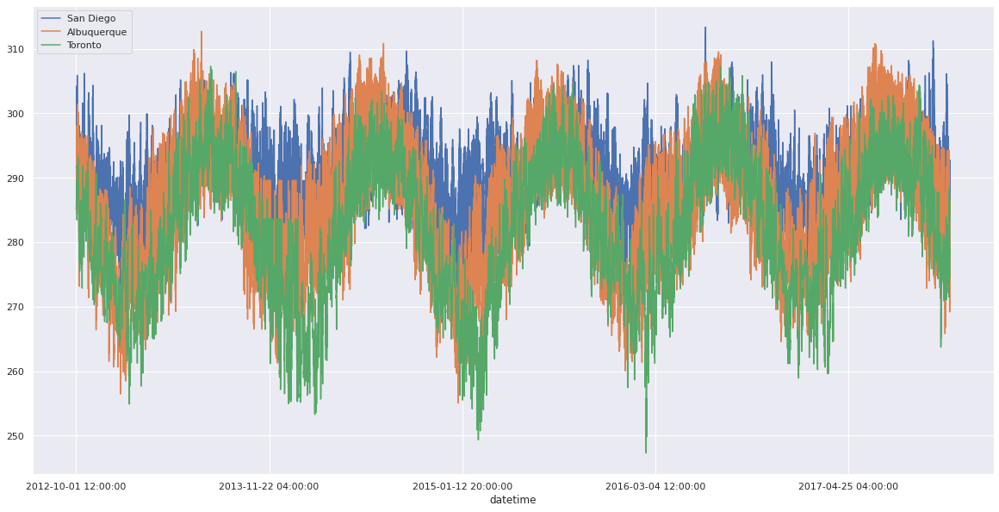

In [28]:
sns.set(rc = {'figure.figsize':(20,10)})
new_data.plot()
plt.show()

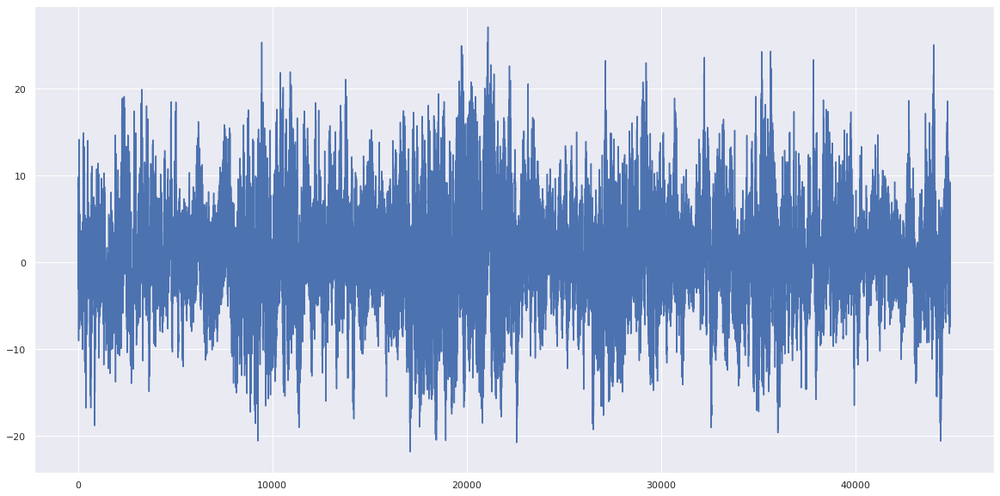

In [29]:
X = new_data['San Diego'].values
diff = list()
days_in_year = 365
for i in range(days_in_year, len(X)):
	value = X[i] - X[i - days_in_year]
	diff.append(value)
plt.plot(diff)
plt.show()

In [30]:
new_data.index

Index(['2012-10-01 12:00:00', '2012-10-01 13:00:00', '2012-10-01 14:00:00',
       '2012-10-01 15:00:00', '2012-10-01 16:00:00', '2012-10-01 17:00:00',
       '2012-10-01 18:00:00', '2012-10-01 19:00:00', '2012-10-01 20:00:00',
       '2012-10-01 21:00:00',
       ...
       '2017-11-29 15:00:00', '2017-11-29 16:00:00', '2017-11-29 17:00:00',
       '2017-11-29 18:00:00', '2017-11-29 19:00:00', '2017-11-29 20:00:00',
       '2017-11-29 21:00:00', '2017-11-29 22:00:00', '2017-11-29 23:00:00',
       '2017-11-30 00:00:00'],
      dtype='object', name='datetime', length=45253)

In [31]:
new_data.index = pd.to_datetime(new_data.index)

             San Diego  Albuquerque     Toronto
datetime                                       
2012-10-31  292.820197   287.119770  283.465823
2012-11-30  289.010924   280.600042  277.473493
2012-12-31  286.137814   274.543923  274.243503
2013-01-31  284.679862   271.810549  271.084847
2013-02-28  285.246950   275.306948  269.776530
2013-03-31  287.512280   282.050090  273.168055
2013-04-30  288.434676   286.300046  278.739921
2013-05-31  290.945427   290.420509  287.562266
2013-06-30  291.610472   297.451233  291.707265
2013-07-31  293.798736   294.248364  294.657459
2013-08-31  293.383988   294.238826  293.028164
2013-09-30  294.012391   291.232161  289.299352
2013-10-31  289.630797   283.788722  284.503049


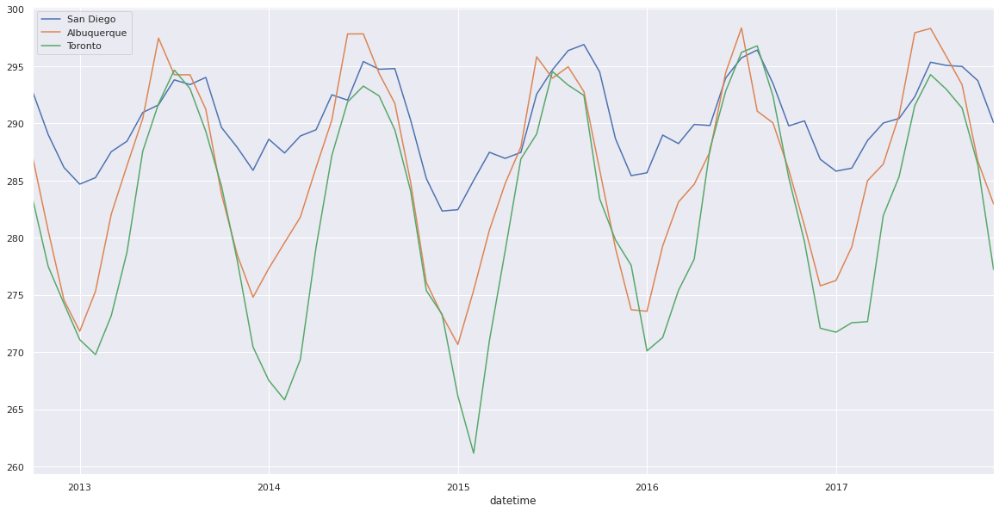

In [32]:
series = new_data
resample = series.resample('M')
monthly_mean = resample.mean()
print(monthly_mean.head(13))
monthly_mean.plot()
plt.show()

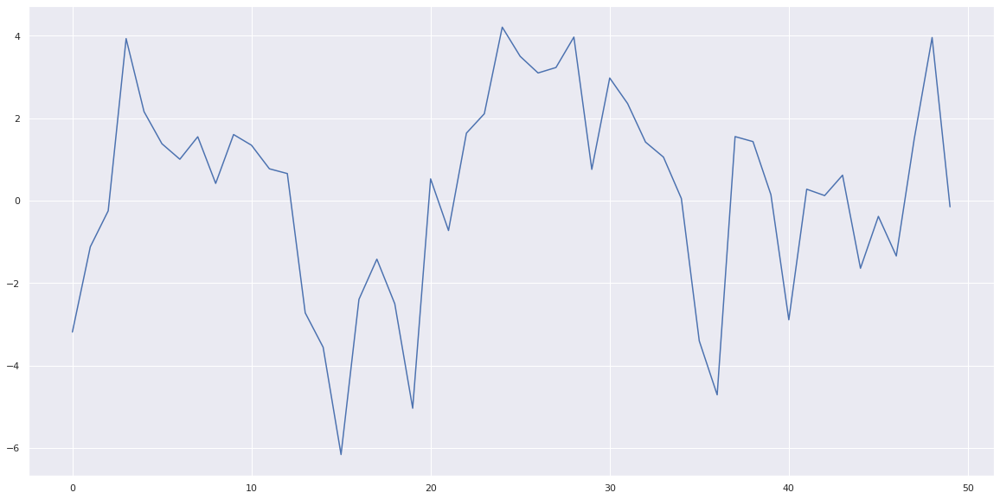

In [33]:
series = new_data['San Diego']
resample = series.resample('M')
monthly_mean = resample.mean()
X = series.values
diff = list()
months_in_year = 12
for i in range(months_in_year, len(monthly_mean)):
	value = monthly_mean[i] - monthly_mean[i - months_in_year]
	diff.append(value)
plt.plot(diff)
plt.show()

In [34]:
new_data

,San Diego,Albuquerque,Toronto
datetime,,,
2012-10-01 12:00:00,NaN,NaN,NaN
2012-10-01 13:00:00,291.530000,285.120000,286.260000
2012-10-01 14:00:00,291.533501,285.154558,286.262541
2012-10-01 15:00:00,291.543355,285.233952,286.269518
2012-10-01 16:00:00,291.553209,285.313345,286.276496
...,...,...,...
2017-11-29 20:00:00,292.150000,285.720000,278.740000
2017-11-29 21:00:00,292.740000,286.450000,278.750000
2017-11-29 22:00:00,292.580000,286.440000,277.550000


In [35]:
new_data = new_data.dropna()

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


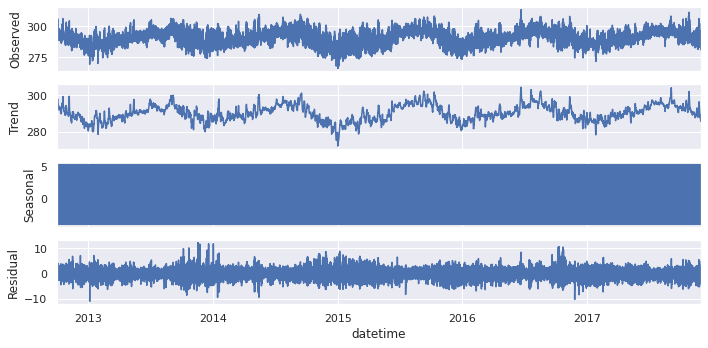

In [36]:
from statsmodels.tsa.seasonal import seasonal_decompose

analysis = new_data[['San Diego']].copy()

decompose_result_mult = seasonal_decompose(analysis, model="additive")

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

plt.rcParams['figure.figsize'] = [10,5]
decompose_result_mult.plot();

In [37]:
from statsmodels.tsa.stattools import adfuller
X = new_data['San Diego'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -9.000817
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [38]:
X = new_data['Albuquerque'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -6.646893
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [39]:
X = new_data['Toronto'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -6.703585
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [40]:
X = new_data['Toronto'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -6.703585
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


ADD SEASON/YEAR TO DATA

In [41]:
temperature2 = pd.read_csv('/content/temperature.csv')

In [42]:
df_season = temperature2[['datetime','San Diego', 'Albuquerque', 'Toronto']]
df_season

,datetime,San Diego,Albuquerque,Toronto
0,2012-10-01 12:00:00,NaN,NaN,NaN
1,2012-10-01 13:00:00,291.530000,285.120000,286.260000
2,2012-10-01 14:00:00,291.533501,285.154558,286.262541
3,2012-10-01 15:00:00,291.543355,285.233952,286.269518
4,2012-10-01 16:00:00,291.553209,285.313345,286.276496
...,...,...,...,...
45248,2017-11-29 20:00:00,292.150000,285.720000,278.740000
45249,2017-11-29 21:00:00,292.740000,286.450000,278.750000
45250,2017-11-29 22:00:00,292.580000,286.440000,277.550000
45251,2017-11-29 23:00:00,292.610000,286.140000,276.160000


In [ ]:
type(df_season.datetime[1])

str

In [43]:
df_season = df_season.dropna()

In [44]:
df_season['datetime'] = pd.to_datetime(df_season['datetime'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [45]:
df_season

,datetime,San Diego,Albuquerque,Toronto
1,2012-10-01 13:00:00,291.530000,285.120000,286.260000
2,2012-10-01 14:00:00,291.533501,285.154558,286.262541
3,2012-10-01 15:00:00,291.543355,285.233952,286.269518
4,2012-10-01 16:00:00,291.553209,285.313345,286.276496
5,2012-10-01 17:00:00,291.563063,285.392738,286.283473
...,...,...,...,...
45248,2017-11-29 20:00:00,292.150000,285.720000,278.740000
45249,2017-11-29 21:00:00,292.740000,286.450000,278.750000
45250,2017-11-29 22:00:00,292.580000,286.440000,277.550000
45251,2017-11-29 23:00:00,292.610000,286.140000,276.160000


In [ ]:
type(df_season.datetime[1])

pandas._libs.tslibs.timestamps.Timestamp

In [46]:
df_season['Month'] = pd.DatetimeIndex(df_season['datetime']).month

df_season['Year'] = pd.DatetimeIndex(df_season['datetime']).year

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [47]:
df_season

,datetime,San Diego,Albuquerque,Toronto,Month,Year
1,2012-10-01 13:00:00,291.530000,285.120000,286.260000,10,2012
2,2012-10-01 14:00:00,291.533501,285.154558,286.262541,10,2012
3,2012-10-01 15:00:00,291.543355,285.233952,286.269518,10,2012
4,2012-10-01 16:00:00,291.553209,285.313345,286.276496,10,2012
5,2012-10-01 17:00:00,291.563063,285.392738,286.283473,10,2012
...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,292.150000,285.720000,278.740000,11,2017
45249,2017-11-29 21:00:00,292.740000,286.450000,278.750000,11,2017
45250,2017-11-29 22:00:00,292.580000,286.440000,277.550000,11,2017
45251,2017-11-29 23:00:00,292.610000,286.140000,276.160000,11,2017


In [48]:
for i in range (len(df_season)):

  if (df_season.loc[df_season.index[i],'datetime'].month == 12 or df_season.loc[df_season.index[i],'datetime'].month == 1 or df_season.loc[df_season.index[i],'datetime'].month == 2):
    df_season.loc[df_season.index[i],'season'] = 'Winter'
  elif (3<= df_season.loc[df_season.index[i],'datetime'].month<6):
    df_season.loc[df_season.index[i],'season'] = 'Spring'
  elif (6<=df_season.loc[df_season.index[i],'datetime'].month<9):
    df_season.loc[df_season.index[i],'season'] = 'Summer'
  elif (9<=df_season.loc[df_season.index[i],'datetime'].month<=11):
    df_season.loc[df_season.index[i],'season'] = 'Fall'

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [49]:
df_season

,datetime,San Diego,Albuquerque,Toronto,Month,Year,season
1,2012-10-01 13:00:00,291.530000,285.120000,286.260000,10,2012,Fall
2,2012-10-01 14:00:00,291.533501,285.154558,286.262541,10,2012,Fall
3,2012-10-01 15:00:00,291.543355,285.233952,286.269518,10,2012,Fall
4,2012-10-01 16:00:00,291.553209,285.313345,286.276496,10,2012,Fall
5,2012-10-01 17:00:00,291.563063,285.392738,286.283473,10,2012,Fall
...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,292.150000,285.720000,278.740000,11,2017,Fall
45249,2017-11-29 21:00:00,292.740000,286.450000,278.750000,11,2017,Fall
45250,2017-11-29 22:00:00,292.580000,286.440000,277.550000,11,2017,Fall
45251,2017-11-29 23:00:00,292.610000,286.140000,276.160000,11,2017,Fall


# MODELS

## ARIMA

In [51]:
df_season

,datetime,San Diego,Albuquerque,Toronto,Month,Year,season
1,2012-10-01 13:00:00,291.530000,285.120000,286.260000,10,2012,Fall
2,2012-10-01 14:00:00,291.533501,285.154558,286.262541,10,2012,Fall
3,2012-10-01 15:00:00,291.543355,285.233952,286.269518,10,2012,Fall
4,2012-10-01 16:00:00,291.553209,285.313345,286.276496,10,2012,Fall
5,2012-10-01 17:00:00,291.563063,285.392738,286.283473,10,2012,Fall
...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,292.150000,285.720000,278.740000,11,2017,Fall
45249,2017-11-29 21:00:00,292.740000,286.450000,278.750000,11,2017,Fall
45250,2017-11-29 22:00:00,292.580000,286.440000,277.550000,11,2017,Fall
45251,2017-11-29 23:00:00,292.610000,286.140000,276.160000,11,2017,Fall


In [52]:
df_season.index = df_season.datetime

In [53]:
df_season.drop(columns=['datetime'],inplace=True,axis=1)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [54]:
df_season

,San Diego,Albuquerque,Toronto,Month,Year,season
datetime,,,,,,
2012-10-01 13:00:00,291.530000,285.120000,286.260000,10,2012,Fall
2012-10-01 14:00:00,291.533501,285.154558,286.262541,10,2012,Fall
2012-10-01 15:00:00,291.543355,285.233952,286.269518,10,2012,Fall
2012-10-01 16:00:00,291.553209,285.313345,286.276496,10,2012,Fall
2012-10-01 17:00:00,291.563063,285.392738,286.283473,10,2012,Fall
...,...,...,...,...,...,...
2017-11-29 20:00:00,292.150000,285.720000,278.740000,11,2017,Fall
2017-11-29 21:00:00,292.740000,286.450000,278.750000,11,2017,Fall
2017-11-29 22:00:00,292.580000,286.440000,277.550000,11,2017,Fall


In [55]:
test_d = df_season[df_season['Year'] == 2017]
test = pd.DataFrame(test_d['San Diego'])
test_samp = test.iloc[-200:]

In [56]:
test

,San Diego
datetime,
2017-01-01 00:00:00,287.06
2017-01-01 01:00:00,285.81
2017-01-01 02:00:00,285.42
2017-01-01 03:00:00,285.51
2017-01-01 04:00:00,285.51
...,...
2017-11-29 20:00:00,292.15
2017-11-29 21:00:00,292.74
2017-11-29 22:00:00,292.58


In [57]:
test_samp

,San Diego
datetime,
2017-11-21 17:00:00,291.21
2017-11-21 18:00:00,295.29
2017-11-21 19:00:00,298.06
2017-11-21 20:00:00,300.07
2017-11-21 21:00:00,299.75
...,...
2017-11-29 20:00:00,292.15
2017-11-29 21:00:00,292.74
2017-11-29 22:00:00,292.58


In [58]:
train_d = df_season[df_season['Year'] != 2017]
train = pd.DataFrame(train_d['San Diego'])
train

,San Diego
datetime,
2012-10-01 13:00:00,291.530000
2012-10-01 14:00:00,291.533501
2012-10-01 15:00:00,291.543355
2012-10-01 16:00:00,291.553209
2012-10-01 17:00:00,291.563063
...,...
2016-12-31 19:00:00,287.650000
2016-12-31 20:00:00,287.980000
2016-12-31 21:00:00,287.810000


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:            D.San Diego   No. Observations:                37258
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -69706.952
Method:                       css-mle   S.D. of innovations              1.571
Date:                Mon, 24 Jan 2022   AIC                         139427.904
Time:                        15:07:29   BIC                         139487.584
Sample:                    10-01-2012   HQIC                        139446.858
                         - 12-31-2016                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.0001      0.014     -0.009      0.993      -0.028       0.028
ar.L1.D.San Diego     0.0509      0.005      9.888      0.000       0.041       0.061
ar.L2.D.San Diego     0.

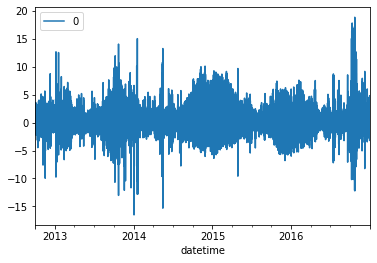

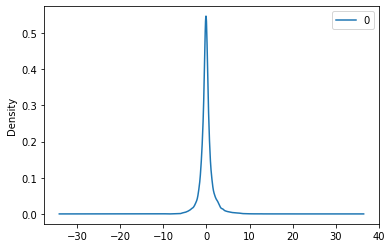

                  0
count  3.725800e+04
mean  -1.324230e-07
std    1.571445e+00
min   -1.651161e+01
25%   -6.197040e-01
50%   -9.672976e-02
75%    4.623334e-01
max    1.882925e+01


In [ ]:
from statsmodels.tsa.arima_model import ARIMA


model = ARIMA(train,order =(5,1,0))
model_fit = model.fit()
print(model_fit.summary())


residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()

residuals.plot(kind='kde')
plt.show()

print(residuals.describe())


In [ ]:
val = train.values
history = [x for x in val]

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


test RMSE: 1.372


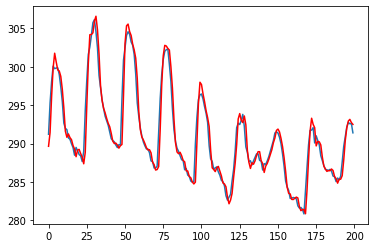

In [ ]:
from sklearn.metrics import mean_squared_error
import math
predictions = []
for t in range(len(test_samp)):
  model = ARIMA(history, order=(5,1,0))
  model_fit = model.fit()
  output = model_fit.forecast()
  yhat = output[0]
  predictions.append(yhat)
  obs = test_samp.loc[test_samp.index[t],'San Diego']
  history.append(obs)
  #print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = math.sqrt(mean_squared_error(test_samp, predictions))
print('test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
plt.plot(test_samp.values)
plt.plot(predictions, color='red')
plt.show()

## shift data

In [59]:
df_season

,San Diego,Albuquerque,Toronto,Month,Year,season
datetime,,,,,,
2012-10-01 13:00:00,291.530000,285.120000,286.260000,10,2012,Fall
2012-10-01 14:00:00,291.533501,285.154558,286.262541,10,2012,Fall
2012-10-01 15:00:00,291.543355,285.233952,286.269518,10,2012,Fall
2012-10-01 16:00:00,291.553209,285.313345,286.276496,10,2012,Fall
2012-10-01 17:00:00,291.563063,285.392738,286.283473,10,2012,Fall
...,...,...,...,...,...,...
2017-11-29 20:00:00,292.150000,285.720000,278.740000,11,2017,Fall
2017-11-29 21:00:00,292.740000,286.450000,278.750000,11,2017,Fall
2017-11-29 22:00:00,292.580000,286.440000,277.550000,11,2017,Fall


In [60]:
temp = pd.DataFrame({ 
    "t_10": df_season["San Diego"].shift(10), 
    "t_9": df_season["San Diego"].shift(9), 
    "t_8": df_season["San Diego"].shift(8), 
    "t_7": df_season["San Diego"].shift(7), 
    "t_6": df_season["San Diego"].shift(6), 
    "t_5": df_season["San Diego"].shift(5), 
    "t_4": df_season["San Diego"].shift(4), 
    "t_3": df_season["San Diego"].shift(3), 
    "t_2": df_season["San Diego"].shift(2), 
    "t_1": df_season["San Diego"].shift(), 
    "San Diego": df_season["San Diego"]
})

In [61]:
temp

,t_10,t_9,t_8,t_7,t_6,t_5,t_4,t_3,t_2,t_1,San Diego
datetime,,,,,,,,,,,
2012-10-01 13:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,291.530000
2012-10-01 14:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,291.530000,291.533501
2012-10-01 15:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,291.530000,291.533501,291.543355
2012-10-01 16:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,291.530000,291.533501,291.543355,291.553209
2012-10-01 17:00:00,NaN,NaN,NaN,NaN,NaN,NaN,291.53,291.533501,291.543355,291.553209,291.563063
...,...,...,...,...,...,...,...,...,...,...,...
2017-11-29 20:00:00,286.43,285.78,285.68,285.06,285.52,285.28,285.75,287.600000,289.640000,290.930000,292.150000
2017-11-29 21:00:00,285.78,285.68,285.06,285.52,285.28,285.75,287.60,289.640000,290.930000,292.150000,292.740000
2017-11-29 22:00:00,285.68,285.06,285.52,285.28,285.75,287.60,289.64,290.930000,292.150000,292.740000,292.580000


In [62]:
temp.dropna(inplace=True,axis=0)
temp

,t_10,t_9,t_8,t_7,t_6,t_5,t_4,t_3,t_2,t_1,San Diego
datetime,,,,,,,,,,,
2012-10-01 23:00:00,291.530000,291.533501,291.543355,291.553209,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334,291.622188
2012-10-02 00:00:00,291.533501,291.543355,291.553209,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334,291.622188,291.632042
2012-10-02 01:00:00,291.543355,291.553209,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334,291.622188,291.632042,291.641896
2012-10-02 02:00:00,291.553209,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334,291.622188,291.632042,291.641896,291.651750
2012-10-02 03:00:00,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334,291.622188,291.632042,291.641896,291.651750,291.661605
...,...,...,...,...,...,...,...,...,...,...,...
2017-11-29 20:00:00,286.430000,285.780000,285.680000,285.060000,285.520000,285.280000,285.750000,287.600000,289.640000,290.930000,292.150000
2017-11-29 21:00:00,285.780000,285.680000,285.060000,285.520000,285.280000,285.750000,287.600000,289.640000,290.930000,292.150000,292.740000
2017-11-29 22:00:00,285.680000,285.060000,285.520000,285.280000,285.750000,287.600000,289.640000,290.930000,292.150000,292.740000,292.580000


In [63]:
x = temp.drop(columns=['San Diego'])
y = pd.DataFrame(temp['San Diego'])

In [64]:
x

,t_10,t_9,t_8,t_7,t_6,t_5,t_4,t_3,t_2,t_1
datetime,,,,,,,,,,
2012-10-01 23:00:00,291.530000,291.533501,291.543355,291.553209,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334
2012-10-02 00:00:00,291.533501,291.543355,291.553209,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334,291.622188
2012-10-02 01:00:00,291.543355,291.553209,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334,291.622188,291.632042
2012-10-02 02:00:00,291.553209,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334,291.622188,291.632042,291.641896
2012-10-02 03:00:00,291.563063,291.572917,291.582772,291.592626,291.602480,291.612334,291.622188,291.632042,291.641896,291.651750
...,...,...,...,...,...,...,...,...,...,...
2017-11-29 20:00:00,286.430000,285.780000,285.680000,285.060000,285.520000,285.280000,285.750000,287.600000,289.640000,290.930000
2017-11-29 21:00:00,285.780000,285.680000,285.060000,285.520000,285.280000,285.750000,287.600000,289.640000,290.930000,292.150000
2017-11-29 22:00:00,285.680000,285.060000,285.520000,285.280000,285.750000,287.600000,289.640000,290.930000,292.150000,292.740000


In [65]:
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(
    n_splits=2,
    gap=1,
    max_train_size=1000,
    test_size=800,
)

In [66]:
splits = list(tscv.split(x, y))
train0, test0 = splits[0]

In [67]:
x_train = x.iloc[train0]
y_train = y.iloc[train0]

x_test = x.iloc[test0]
y_test = y.iloc[test0]

In [68]:
x_train

,t_10,t_9,t_8,t_7,t_6,t_5,t_4,t_3,t_2,t_1
datetime,,,,,,,,,,
2017-08-13 16:00:00,291.92,291.92,291.76,291.40,291.82,290.93,291.15,291.37,291.21,290.68
2017-08-13 17:00:00,291.92,291.76,291.40,291.82,290.93,291.15,291.37,291.21,290.68,292.53
2017-08-13 18:00:00,291.76,291.40,291.82,290.93,291.15,291.37,291.21,290.68,292.53,293.84
2017-08-13 19:00:00,291.40,291.82,290.93,291.15,291.37,291.21,290.68,292.53,293.84,295.82
2017-08-13 20:00:00,291.82,290.93,291.15,291.37,291.21,290.68,292.53,293.84,295.82,296.75
...,...,...,...,...,...,...,...,...,...,...
2017-09-24 03:00:00,291.31,292.40,293.73,294.42,295.31,294.51,294.90,294.57,294.15,293.14
2017-09-24 04:00:00,292.40,293.73,294.42,295.31,294.51,294.90,294.57,294.15,293.14,291.68
2017-09-24 05:00:00,293.73,294.42,295.31,294.51,294.90,294.57,294.15,293.14,291.68,291.33


In [69]:
y_train

,San Diego
datetime,
2017-08-13 16:00:00,292.53
2017-08-13 17:00:00,293.84
2017-08-13 18:00:00,295.82
2017-08-13 19:00:00,296.75
2017-08-13 20:00:00,297.68
...,...
2017-09-24 03:00:00,291.68
2017-09-24 04:00:00,291.33
2017-09-24 05:00:00,290.14


In [70]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

x_test = sc.fit_transform(x_test)
y_test = sc.fit_transform(y_test)
x_train = sc.fit_transform(x_train)
y_train = sc.fit_transform(y_train)

## RNN

In [72]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [73]:
from keras.layers import Dense , Dropout , Input , LSTM ,GRU, RNN
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import SGD
from keras.models import Model
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from IPython.display import Audio
import librosa
import glob

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

In [74]:
input = Input(shape=(10,1), name ="Input")
layer = layers.SimpleRNN(50,activation='relu', return_sequences=True)(input)
hidden_layer = layers.SimpleRNN(50 ,activation='relu' , name="layer1")(layer)
output_layer = Dense(1 ,activation='linear' , name="output")(hidden_layer)

model = Model(inputs=input, outputs=output_layer , name = "model1")
model.summary()

Model: "model1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 10, 1)]           0         
                                                                 
 simple_rnn (SimpleRNN)      (None, 10, 50)            2600      
                                                                 
 layer1 (SimpleRNN)          (None, 50)                5050      
                                                                 
 output (Dense)              (None, 1)                 51        
                                                                 
Total params: 7,701
Trainable params: 7,701
Non-trainable params: 0
_________________________________________________________________


In [75]:
es = EarlyStopping(monitor='val_loss',mode = 'auto',verbose=1,patience=7)
model.compile(optimizer='adam', loss='mse')

In [76]:
history = model.fit(x_train,y_train,epochs=100,batch_size = 16 ,verbose=1,callbacks=[es],validation_split=0.2)

Epoch 1/100
50/50 [==============================] - 3s 15ms/step - loss: 0.2178 - val_loss: 0.0761
Epoch 2/100
50/50 [==============================] - 0s 7ms/step - loss: 0.0664 - val_loss: 0.0490
Epoch 3/100
50/50 [==============================] - 0s 8ms/step - loss: 0.0499 - val_loss: 0.0277
Epoch 4/100
50/50 [==============================] - 0s 7ms/step - loss: 0.0474 - val_loss: 0.0245
Epoch 5/100
50/50 [==============================] - 0s 8ms/step - loss: 0.0433 - val_loss: 0.0373
Epoch 6/100
50/50 [==============================] - 0s 8ms/step - loss: 0.0488 - val_loss: 0.0269
Epoch 7/100
50/50 [==============================] - 0s 8ms/step - loss: 0.0396 - val_loss: 0.0215
Epoch 8/100
50/50 [==============================] - 0s 7ms/step - loss: 0.0410 - val_loss: 0.0315
Epoch 9/100
50/50 [==============================] - 0s 8ms/step - loss: 0.0388 - val_loss: 0.0202
Epoch 10/100
50/50 [==============================] - 0s 7ms/step - loss: 0.0352 - val_loss: 0.0209
Epoch 11

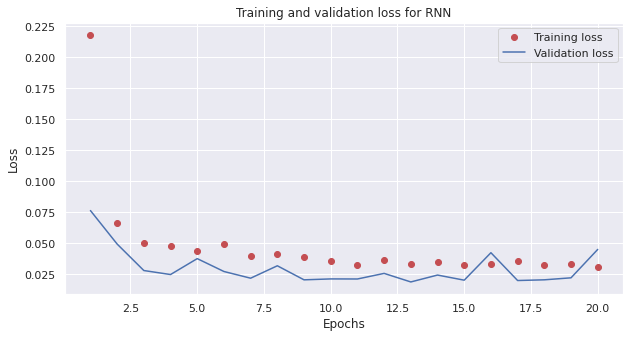

In [77]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss for RNN')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [79]:
from sklearn.metrics import mean_squared_error
ypred = model.predict(x_test)
mse = mean_squared_error(y_test, ypred)
print(mse)

0.041155342132327404


## GRU

In [89]:
input = Input(shape=(10,1), name ="Input")
layer = layers.GRU(50,activation='relu', return_sequences=True)(input)
hidden_layer = layers.GRU(50 ,activation='relu' , name="layer1")(layer)
output_layer = Dense(1 ,activation='linear' , name="output")(hidden_layer)

model = Model(inputs=input, outputs=output_layer , name = "model")
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 10, 1)]           0         
                                                                 
 gru_1 (GRU)                 (None, 10, 50)            7950      
                                                                 
 layer1 (GRU)                (None, 50)                15300     
                                                                 
 output (Dense)              (None, 1)                 51        
                                                                 
Total params: 23,301
Trainable params: 23,301
Non-trainable params: 0
_________________________________________________________________


In [90]:
es = EarlyStopping(monitor='val_loss',mode = 'auto',verbose=1,patience=5)
model.compile(optimizer='adam', loss='mse')

In [91]:
history = model.fit(x_train,y_train,epochs=100,batch_size = 32 ,verbose=1,callbacks=[es],validation_split=0.2)

Epoch 1/100
25/25 [==============================] - 2s 26ms/step - loss: 0.5345 - val_loss: 0.3854
Epoch 2/100
25/25 [==============================] - 0s 11ms/step - loss: 0.2268 - val_loss: 0.0781
Epoch 3/100
25/25 [==============================] - 0s 12ms/step - loss: 0.0608 - val_loss: 0.0292
Epoch 4/100
25/25 [==============================] - 0s 11ms/step - loss: 0.0490 - val_loss: 0.0271
Epoch 5/100
25/25 [==============================] - 0s 11ms/step - loss: 0.0440 - val_loss: 0.0355
Epoch 6/100
25/25 [==============================] - 0s 11ms/step - loss: 0.0465 - val_loss: 0.0283
Epoch 7/100
25/25 [==============================] - 0s 11ms/step - loss: 0.0426 - val_loss: 0.0236
Epoch 8/100
25/25 [==============================] - 0s 12ms/step - loss: 0.0450 - val_loss: 0.0222
Epoch 9/100
25/25 [==============================] - 0s 11ms/step - loss: 0.0461 - val_loss: 0.0220
Epoch 10/100
25/25 [==============================] - 0s 12ms/step - loss: 0.0439 - val_loss: 0.0219

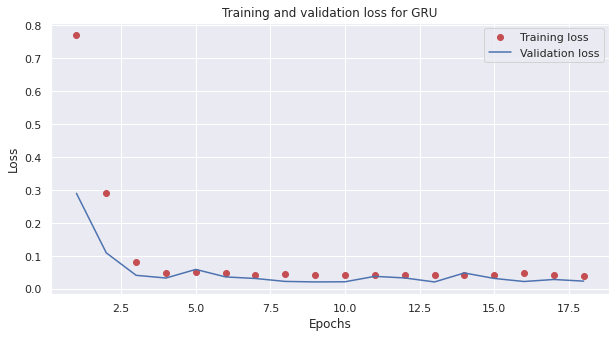

In [83]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss for GRU')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [92]:
ypred = model.predict(x_test)
mse = mean_squared_error(y_test, ypred)
print(mse)

0.03749481605039214


## LSTM

In [84]:
input = Input(shape=(10,1), name ="Input")
layer = layers.LSTM(50,activation='relu', return_sequences=True)(input)
hidden_layer = layers.LSTM(50 ,activation='relu' , name="layer1")(layer)
output_layer = Dense(1 ,activation='linear' , name="output")(hidden_layer)

model = Model(inputs=input, outputs=output_layer , name = "model")
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 10, 1)]           0         
                                                                 
 lstm (LSTM)                 (None, 10, 50)            10400     
                                                                 
 layer1 (LSTM)               (None, 50)                20200     
                                                                 
 output (Dense)              (None, 1)                 51        
                                                                 
Total params: 30,651
Trainable params: 30,651
Non-trainable params: 0
_________________________________________________________________


In [85]:
es = EarlyStopping(monitor='val_loss',mode = 'auto',verbose=1,patience=7)
model.compile(optimizer='adam', loss='mse')

In [86]:
history = model.fit(x_train,y_train,epochs=100,batch_size = 32 ,verbose=1,validation_split=0.2)

Epoch 1/100
25/25 [==============================] - 6s 48ms/step - loss: 0.9032 - val_loss: 0.6850
Epoch 2/100
25/25 [==============================] - 1s 22ms/step - loss: 0.6440 - val_loss: 0.3792
Epoch 3/100
25/25 [==============================] - 1s 23ms/step - loss: 0.3676 - val_loss: 0.4230
Epoch 4/100
25/25 [==============================] - 1s 20ms/step - loss: 0.1896 - val_loss: 0.1101
Epoch 5/100
25/25 [==============================] - 1s 20ms/step - loss: 0.1276 - val_loss: 0.1070
Epoch 6/100
25/25 [==============================] - 1s 24ms/step - loss: 0.0947 - val_loss: 0.0434
Epoch 7/100
25/25 [==============================] - 1s 22ms/step - loss: 0.1177 - val_loss: 0.1161
Epoch 8/100
25/25 [==============================] - 1s 21ms/step - loss: 0.0797 - val_loss: 0.0409
Epoch 9/100
25/25 [==============================] - 1s 21ms/step - loss: 0.0668 - val_loss: 0.0302
Epoch 10/100
25/25 [==============================] - 1s 26ms/step - loss: 0.0527 - val_loss: 0.0671

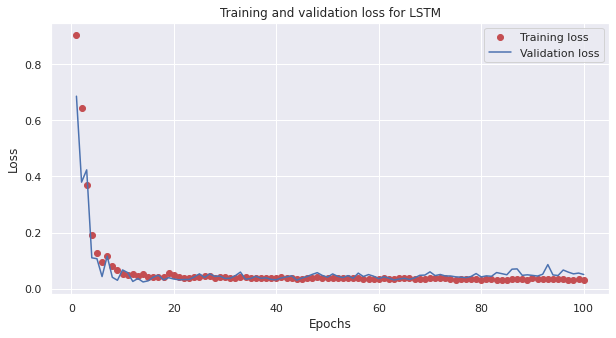

In [87]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss for LSTM')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [88]:
ypred = model.predict(x_test)
mse = mean_squared_error(y_test, ypred)
print(mse)

0.03592270185146553


## CNN

In [105]:
from keras.layers import Conv1D, MaxPooling1D, Flatten

input = Input(shape=(10,1), name ="Input")
layer = Conv1D(filters=64, kernel_size=3, activation='relu')(input)
hidden_layer1 = Conv1D(filters=64, kernel_size=3, activation='relu')(layer)
hidden_layer2 = MaxPooling1D(pool_size=2)(hidden_layer1)
flatt_leyer = Flatten()(hidden_layer2)
hidden_layer3 = Dense(50, activation='relu')(flatt_leyer)
output_layer = Dense(1 ,activation='linear' , name="output")(hidden_layer3)

model = Model(inputs=input, outputs=output_layer , name = "model")
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 10, 1)]           0         
                                                                 
 conv1d_4 (Conv1D)           (None, 8, 64)             256       
                                                                 
 conv1d_5 (Conv1D)           (None, 6, 64)             12352     
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 3, 64)            0         
 1D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 192)               0         
                                                                 
 dense_2 (Dense)             (None, 50)                9650      
                                                             

In [106]:
es = EarlyStopping(monitor='val_loss',mode = 'auto',verbose=1,patience=7)
model.compile(optimizer='adam', loss='mse')

In [107]:
history = model.fit(x_train,y_train,epochs=100,batch_size = 32 ,verbose=1,validation_split=0.2)

Epoch 1/100
25/25 [==============================] - 1s 19ms/step - loss: 0.5749 - val_loss: 0.2931
Epoch 2/100
25/25 [==============================] - 0s 12ms/step - loss: 0.2022 - val_loss: 0.1075
Epoch 3/100
25/25 [==============================] - 0s 14ms/step - loss: 0.1124 - val_loss: 0.0686
Epoch 4/100
25/25 [==============================] - 0s 13ms/step - loss: 0.0810 - val_loss: 0.0362
Epoch 5/100
25/25 [==============================] - 0s 14ms/step - loss: 0.0614 - val_loss: 0.0319
Epoch 6/100
25/25 [==============================] - 0s 13ms/step - loss: 0.0519 - val_loss: 0.0267
Epoch 7/100
25/25 [==============================] - 0s 14ms/step - loss: 0.0462 - val_loss: 0.0262
Epoch 8/100
25/25 [==============================] - 0s 13ms/step - loss: 0.0453 - val_loss: 0.0274
Epoch 9/100
25/25 [==============================] - 0s 14ms/step - loss: 0.0431 - val_loss: 0.0535
Epoch 10/100
25/25 [==============================] - 0s 13ms/step - loss: 0.0439 - val_loss: 0.0373

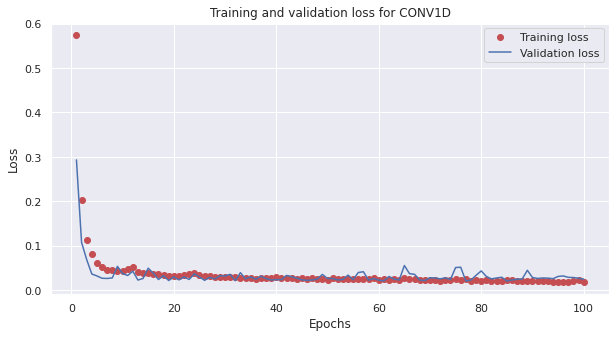

In [108]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss for CONV1D')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [109]:
ypred = model.predict(x_test)
errors = mean_squared_error(y_test, ypred)
print(errors)

0.038931104274356594


## PROPHET

In [121]:
new_df = pd.read_csv('/content/temperature.csv')

In [122]:
new_df = new_df[['datetime', 'San Diego']]

In [123]:
new_df = new_df.dropna()

In [124]:
data_p = new_df
data_p.columns= ['ds', 'y']

In [125]:
import fbprophet
from fbprophet import Prophet
p = Prophet()
p.fit(data_p)

In [130]:
new_df

,ds,y
1,2012-10-01 13:00:00,291.530000
2,2012-10-01 14:00:00,291.533501
3,2012-10-01 15:00:00,291.543355
4,2012-10-01 16:00:00,291.553209
5,2012-10-01 17:00:00,291.563063
...,...,...
45248,2017-11-29 20:00:00,292.150000
45249,2017-11-29 21:00:00,292.740000
45250,2017-11-29 22:00:00,292.580000
45251,2017-11-29 23:00:00,292.610000


In [131]:
new_df['index'] = list(range(len(new_df)))
new_df.set_index(new_df['index'], inplace = True)

In [133]:
new_df['ds'] = pd.to_datetime(new_df['ds'])

In [126]:
feature = pd.DataFrame(data_p['ds'])

In [127]:
forecast = p.predict(feature)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2012-10-01 13:00:00,289.839267,285.921260,293.983157
1,2012-10-01 14:00:00,290.285516,286.291977,293.901648
2,2012-10-01 15:00:00,291.335975,287.247887,294.997928
3,2012-10-01 16:00:00,292.970251,289.179180,296.668262
4,2012-10-01 17:00:00,294.905346,290.969294,298.983844
...,...,...,...,...
45247,2017-11-29 20:00:00,294.424950,290.470069,298.258437
45248,2017-11-29 21:00:00,294.682132,290.826204,298.459119
45249,2017-11-29 22:00:00,294.545962,290.647260,298.184502
45250,2017-11-29 23:00:00,294.069262,290.180698,298.011683


In [134]:
diff = pd.merge(forecast,data_p ,on="ds")
diff

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat,y,index
0,2012-10-01 13:00:00,291.317187,285.921260,293.983157,291.317187,291.317187,-1.477920,-1.477920,-1.477920,-3.984526,-3.984526,-3.984526,-0.045373,-0.045373,-0.045373,2.551979,2.551979,2.551979,0.0,0.0,0.0,289.839267,291.530000,0
1,2012-10-01 14:00:00,291.316333,286.291977,293.901648,291.316333,291.316333,-1.030817,-1.030817,-1.030817,-3.531727,-3.531727,-3.531727,-0.047915,-0.047915,-0.047915,2.548824,2.548824,2.548824,0.0,0.0,0.0,290.285516,291.533501,1
2,2012-10-01 15:00:00,291.315480,287.247887,294.997928,291.315480,291.315480,0.020495,0.020495,0.020495,-2.474397,-2.474397,-2.474397,-0.050795,-0.050795,-0.050795,2.545688,2.545688,2.545688,0.0,0.0,0.0,291.335975,291.543355,2
3,2012-10-01 16:00:00,291.314626,289.179180,296.668262,291.314626,291.314626,1.655625,1.655625,1.655625,-0.832952,-0.832952,-0.832952,-0.053993,-0.053993,-0.053993,2.542570,2.542570,2.542570,0.0,0.0,0.0,292.970251,291.553209,3
4,2012-10-01 17:00:00,291.313773,290.969294,298.983844,291.313773,291.313773,3.591573,3.591573,3.591573,1.109583,1.109583,1.109583,-0.057480,-0.057480,-0.057480,2.539470,2.539470,2.539470,0.0,0.0,0.0,294.905346,291.563063,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45247,2017-11-29 20:00:00,291.124540,290.470069,298.258437,291.124540,291.124540,3.300411,3.300411,3.300411,5.062081,5.062081,5.062081,0.079828,0.079828,0.079828,-1.841498,-1.841498,-1.841498,0.0,0.0,0.0,294.424950,292.150000,45247
45248,2017-11-29 21:00:00,291.124614,290.826204,298.459119,291.124614,291.124614,3.557518,3.557518,3.557518,5.318527,5.318527,5.318527,0.085454,0.085454,0.085454,-1.846462,-1.846462,-1.846462,0.0,0.0,0.0,294.682132,292.740000,45248
45249,2017-11-29 22:00:00,291.124688,290.647260,298.184502,291.124688,291.124688,3.421274,3.421274,3.421274,5.182130,5.182130,5.182130,0.090586,0.090586,0.090586,-1.851442,-1.851442,-1.851442,0.0,0.0,0.0,294.545962,292.580000,45249
45250,2017-11-29 23:00:00,291.124762,290.180698,298.011683,291.124762,291.124762,2.944500,2.944500,2.944500,4.705725,4.705725,4.705725,0.095211,0.095211,0.095211,-1.856437,-1.856437,-1.856437,0.0,0.0,0.0,294.069262,292.610000,45250


In [135]:
diff = diff[['ds','y','yhat']]
diff

,ds,y,yhat
0,2012-10-01 13:00:00,291.530000,289.839267
1,2012-10-01 14:00:00,291.533501,290.285516
2,2012-10-01 15:00:00,291.543355,291.335975
3,2012-10-01 16:00:00,291.553209,292.970251
4,2012-10-01 17:00:00,291.563063,294.905346
...,...,...,...
45247,2017-11-29 20:00:00,292.150000,294.424950
45248,2017-11-29 21:00:00,292.740000,294.682132
45249,2017-11-29 22:00:00,292.580000,294.545962
45250,2017-11-29 23:00:00,292.610000,294.069262


In [137]:
mse = (mean_squared_error(diff['y'], diff['yhat']))
print('Test MSE: %.3f' % mse)

Test MSE: 9.206


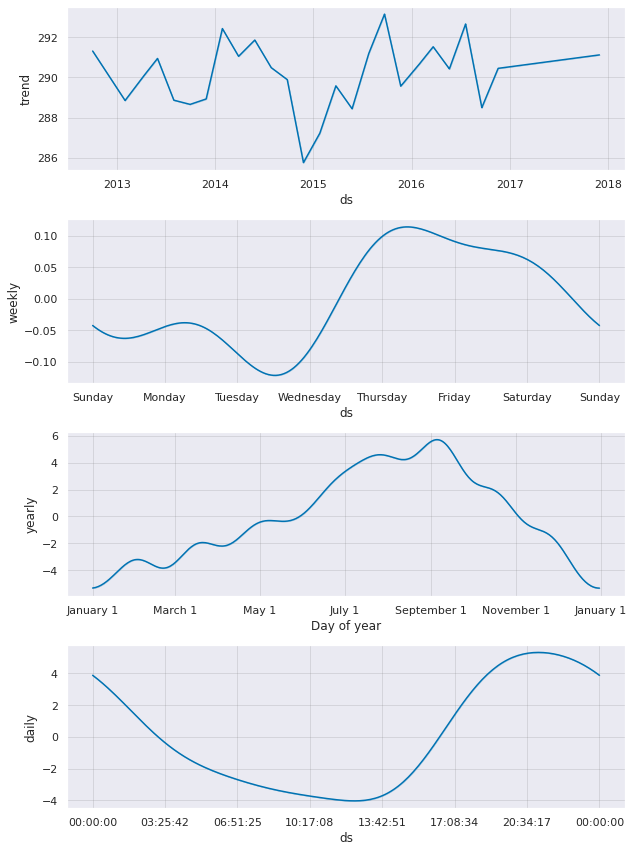

In [118]:
fig2 = p.plot_components(forecast)

In [119]:
from fbprophet.plot import plot_plotly, plot_components_plotly

plot_plotly(p, forecast)

In [120]:
from fbprophet.plot import plot_components_plotly

plot_components_plotly(p, forecast)